## Syllabus:
- Basic Image Processing
- Training MNIST Digits using CNN's
- Residual Network
- Transfer Learning
- Semantic Segmentation using UNET

## Basic Image Processing

In [ ]:
#download cat image
!wget https://upload.wikimedia.org/wikipedia/commons/3/3a/Cat03.jpg

--2023-05-21 04:43:54--  https://upload.wikimedia.org/wikipedia/commons/3/3a/Cat03.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 279603 (273K) [image/jpeg]
Saving to: ‘Cat03.jpg’

Cat03.jpg           100%[===================>] 273.05K  --.-KB/s    in 0.05s   

2023-05-21 04:43:54 (5.71 MB/s) - ‘Cat03.jpg’ saved [279603/279603]



In [ ]:
import cv2

#read image
img = cv2.imread('Cat03.jpg')

In [ ]:
import matplotlib.pyplot as plt

def imshow(img, channel=3):
    plt.figure(figsize=(20,20))
    if channel == 3:
        plt.imshow(img[:,:,::-1])
    else:
        plt.imshow(img, cmap='gray')
    plt.show()

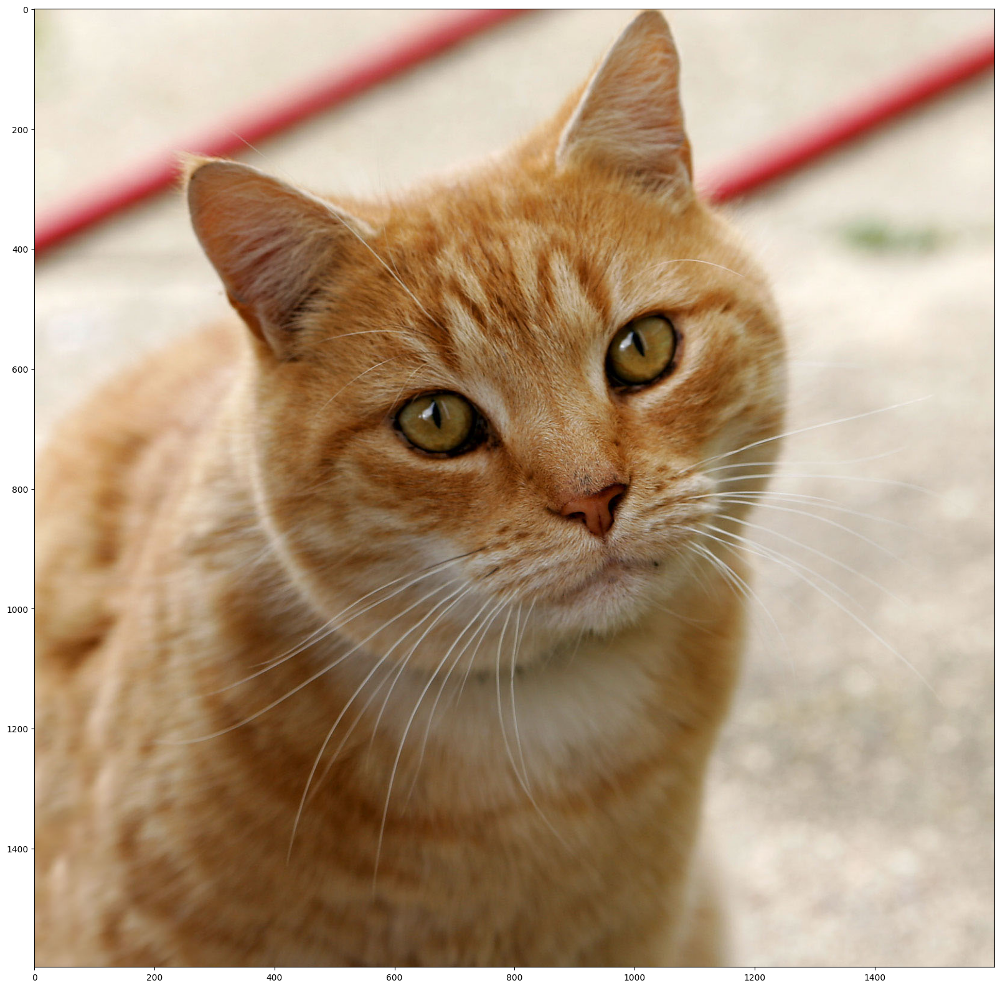

In [ ]:
imshow(img)

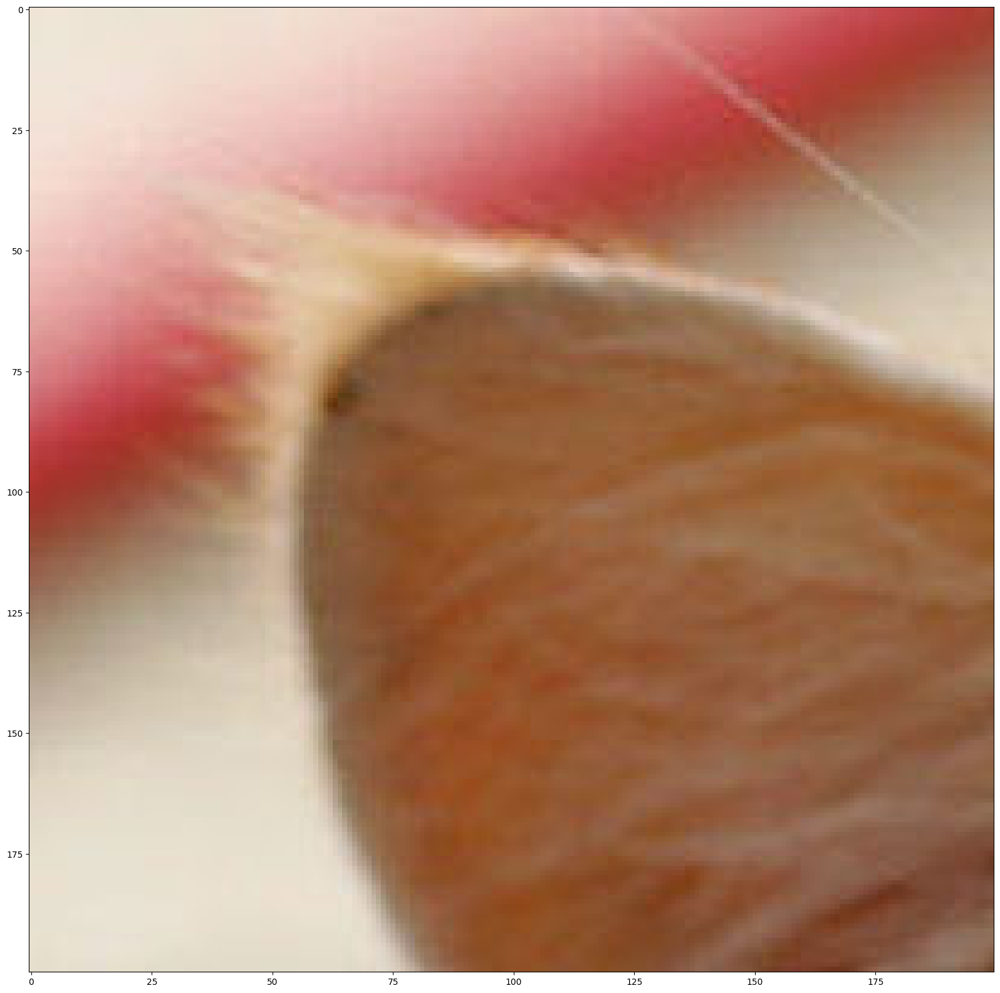

In [ ]:
#crop image
img_crop = img[200:400, 200:400]
imshow(img_crop)

In [ ]:
def to_gray(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img_gray

In [ ]:
#convert to gray
img_gray = to_gray(img)

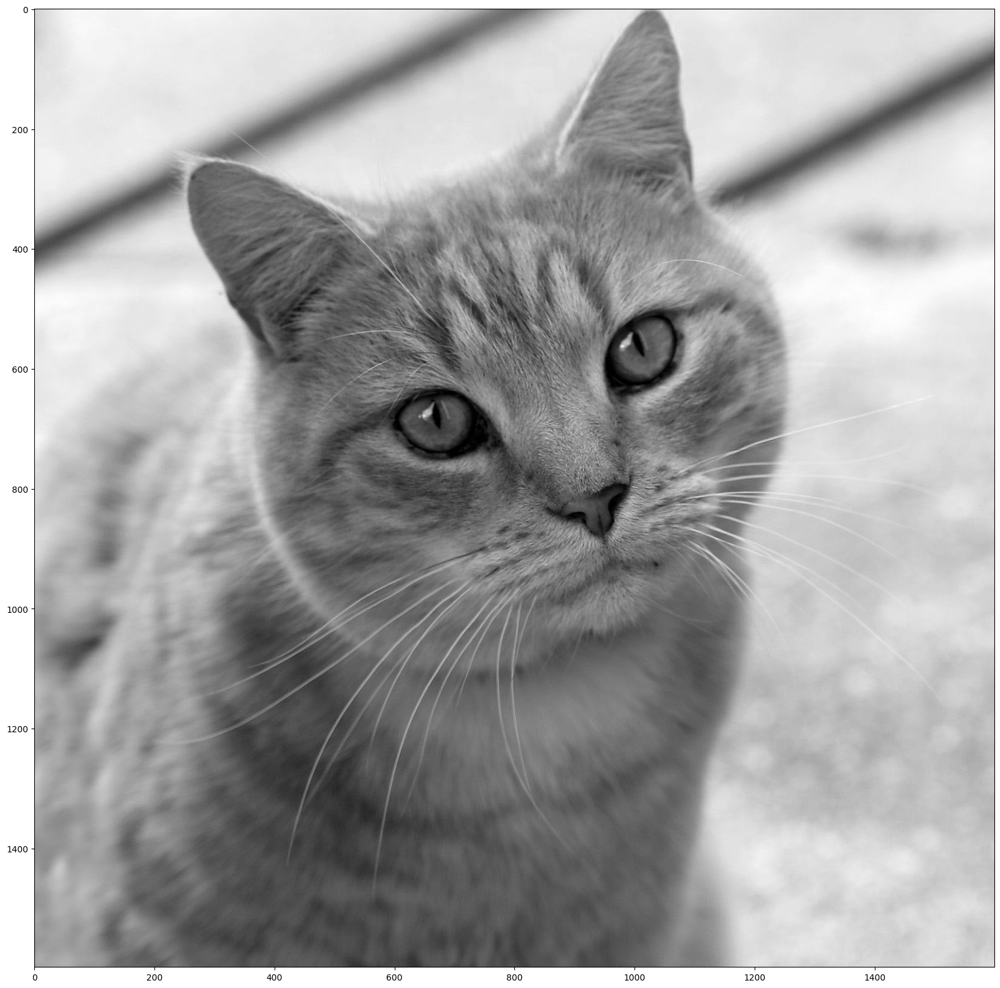

In [ ]:
imshow(img_gray, channel=1)

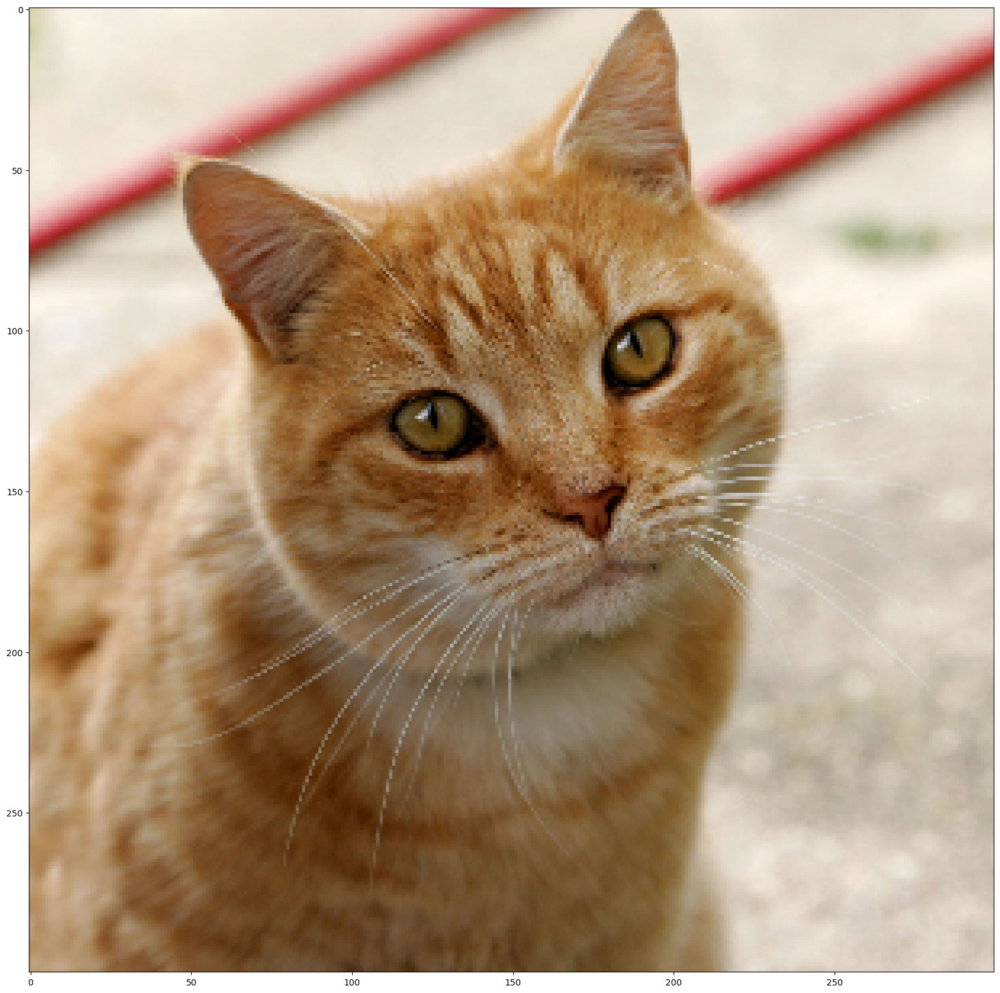

In [ ]:
#resize image
img_resize = cv2.resize(img, (300, 300))
imshow(img_resize)

In [ ]:
#minmax normalize image
img_norm = img/255
print(img_norm.max(), img_norm.min(), img_norm.mean())

1.0 0.0 0.5823366728835888


In [ ]:
#standard normalize image
img_norm = (img-img.mean())/img.std()
print(img_norm.max(), img_norm.min(), img_norm.mean())

1.6876265498524496 -2.353012022616881 2.28310394277192e-16


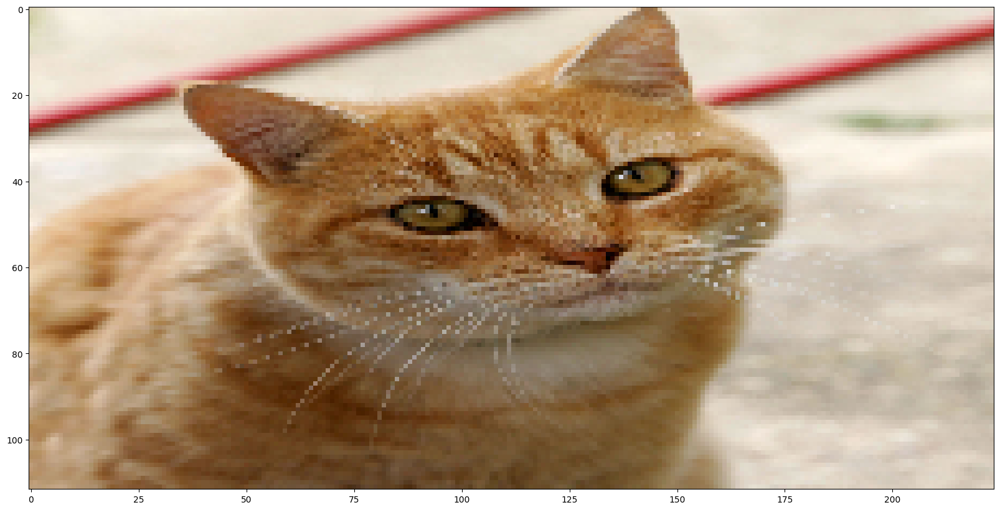

In [ ]:
#resize Image
img_resized = cv2.resize(img, (224,112))
imshow(img_resized)

## Training MNIST Digits using CNN

In [ ]:
import torch
from torchvision import datasets, transforms
from torch import nn, optim

In [ ]:
# Define transform to normalize data
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])

# Download and load the training data
trainset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

# Download and load the test data
testset = datasets.MNIST('~/.pytorch/MNIST_data/', download=True, train=False, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=64, shuffle=True)

In [ ]:
class Classifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 20, 5, 1)
        self.conv2 = nn.Conv2d(20, 50, 5, 1)
        self.fc1 = nn.Linear(4*4*50, 500)
        self.fc2 = nn.Linear(500, 10)

    def forward(self, x):
        x = nn.functional.relu(self.conv1(x))
        x = nn.functional.max_pool2d(x, 2, 2)
        x = nn.functional.relu(self.conv2(x))
        x = nn.functional.max_pool2d(x, 2, 2)
        x = x.view(-1, 4*4*50)
        x = nn.functional.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Initialize our model, loss function, and optimizer
model = Classifier().to('cuda')
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.003, momentum=0.9)

In [ ]:
# Number of epochs to train the model
n_epochs = 10

for epoch in range(n_epochs):
    train_loss = 0
    eval_loss = 0
    # Train Step
    for images, labels in trainloader:
        # Flatten MNIST images into a long vector
        images = images.to('cuda')
        labels = labels.to('cuda')
        
        # Training pass
        optimizer.zero_grad()
        
        output = model(images)
        loss = criterion(output, labels)
        
        #This is where the model learns by backpropagating
        loss.backward()
        
        #And optimizes its weights here
        optimizer.step()
        
        train_loss += loss.item()

    #eval step
    for images, labels in testloader:
        # Flatten MNIST images into a long vector
        images = images.to('cuda')
        labels = labels.to('cuda')
        
        
        output = model(images)
        loss = criterion(output, labels)
        
        
        eval_loss += loss.item()
    print(f"Epoch {epoch+1} - Training loss: {train_loss/len(trainloader)}")
    print(f"Epoch {epoch+1} - Training loss: {eval_loss/len(testloader)}")


Epoch 1 - Training loss: 0.06506138973370958
Epoch 1 - Training loss: 0.047353711093414075
Epoch 2 - Training loss: 0.04900758805151568
Epoch 2 - Training loss: 0.03983494610626512
Epoch 3 - Training loss: 0.039398594903372434
Epoch 3 - Training loss: 0.03716859318743086
Epoch 4 - Training loss: 0.033214346637444464
Epoch 4 - Training loss: 0.030025565109191948
Epoch 5 - Training loss: 0.028325763837395133
Epoch 5 - Training loss: 0.029206915281024898
Epoch 6 - Training loss: 0.025121973891211832
Epoch 6 - Training loss: 0.0308705916343506
Epoch 7 - Training loss: 0.021720974346131846
Epoch 7 - Training loss: 0.027761281241075533
Epoch 8 - Training loss: 0.01942083199241279
Epoch 8 - Training loss: 0.02477909522472175
Epoch 9 - Training loss: 0.016315043524777303
Epoch 9 - Training loss: 0.025357706047306104
Epoch 10 - Training loss: 0.014999990969582194
Epoch 10 - Training loss: 0.02697863857833532


# Residual Network

In [ ]:
import torch
from torchvision import datasets, transforms, models
from torch import nn, optim

In [ ]:
# Define transform to normalize data
transform = transforms.Compose([
    transforms.Resize(255),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load the STL-10 dataset
train_data = datasets.STL10('~/.pytorch/STL10_data/', split='train', download=True, transform=transform)
test_data = datasets.STL10('~/.pytorch/STL10_data/', split='test', download=True, transform=transform)

# Data loaders
trainloader = torch.utils.data.DataLoader(train_data, batch_size=64, shuffle=True)
testloader = torch.utils.data.DataLoader(test_data, batch_size=64, shuffle=True)

100%|██████████| 2640397119/2640397119 [05:01<00:00, 8757671.39it/s] 


Extracting /root/.pytorch/STL10_data/stl10_binary.tar.gz to /root/.pytorch/STL10_data/
Files already downloaded and verified


In [ ]:
# Load the pretrained model
model = models.resnet18()
num_ftrs = model.fc.in_features

# Here the size of each output sample is set to 10.
model.fc = nn.Linear(num_ftrs, 10)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move model to the device
model = model.to(device)

In [ ]:
# Training loop
n_epochs = 10
for epoch in range(n_epochs):
    running_loss = 0.0
    correct = 0
    total = 0

    for i, data in enumerate(trainloader, 0):
        inputs, labels = data[0].to(device), data[1].to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward + backward + optimize
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # Calculate accuracy
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
        # Print statistics
        running_loss += loss.item()
        if i % 100 == 99:    # Print every 100 mini-batches
            print('[Epoch %d, Batch %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

    print(f'Training Accuracy: {100 * correct / total}')

# Validation loop for evaluation
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the test images: %d %%' % (
    100 * correct / total))

Training Accuracy: 21.36
Training Accuracy: 31.42
Training Accuracy: 36.32
Training Accuracy: 38.52
Training Accuracy: 42.2
Training Accuracy: 43.54
Training Accuracy: 47.3
Training Accuracy: 50.26
Training Accuracy: 52.62
Training Accuracy: 55.12
Accuracy of the network on the test images: 49 %


## Transfer Learning

In [ ]:
# Load the pretrained model
model = models.resnet18(pretrained=True)

# Freeze all the layers in the backbone
for param in model.parameters():
    param.requires_grad = False

# Replace the final fully connected layer
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 10)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 141MB/s]


In [ ]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move model to the device
model = model.to(device)

In [ ]:
# Training loop
n_epochs = 10
for epoch in range(n_epochs):
    running_loss = 0.0
    correct = 0
    total = 0

    for i, data in enumerate(trainloader, 0):
        inputs, labels = data[0].to(device), data[1].to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward + backward + optimize
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # Calculate accuracy
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
        # Print statistics
        running_loss += loss.item()
        if i % 100 == 99:    # Print every 100 mini-batches
            print('[Epoch %d, Batch %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

    print(f'Training Accuracy: {100 * correct / total}')

# Validation loop for evaluation
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the test images: %d %%' % (
    100 * correct / total))

Training Accuracy: 64.76
Training Accuracy: 90.76
Training Accuracy: 91.72
Training Accuracy: 92.38
Training Accuracy: 93.02
Training Accuracy: 93.3
Training Accuracy: 94.08
Training Accuracy: 94.08
Training Accuracy: 93.94
Training Accuracy: 94.4
Accuracy of the network on the test images: 94 %


## Semantic Segmentation using U-Net

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!mkdir data/

In [ ]:
!cp drive/MyDrive/bootcamp/data/data-science-bowl-2018.zip data/

In [ ]:
%cd data

/content/data


In [ ]:
!unzip data-science-bowl-2018.zip

Archive:  data-science-bowl-2018.zip
  inflating: stage1_sample_submission.csv.zip  
  inflating: stage1_solution.csv.zip  
  inflating: stage1_test.zip         
  inflating: stage1_train.zip        
  inflating: stage1_train_labels.csv.zip  
  inflating: stage2_sample_submission_final.csv.zip  
  inflating: stage2_test_final.zip   


In [ ]:
!mkdir ../datasets_used

In [ ]:
!unzip stage1_train.zip

Streaming output truncated to the last 5000 lines.
  inflating: d35f25c8e3f7fca5232fc4d5e3faf14b025b20b3731af77fe971a5e2e9d69d28/masks/160cf18b03df69978e2ed33335afcd781ebebf4ee42df566aaa6fd0aee66ac93.png  
  inflating: d35f25c8e3f7fca5232fc4d5e3faf14b025b20b3731af77fe971a5e2e9d69d28/masks/16d3bf2426e9cda0e4f435de3a0c260d17be460f1c834c1282dfd68f9fcf7509.png  
  inflating: d35f25c8e3f7fca5232fc4d5e3faf14b025b20b3731af77fe971a5e2e9d69d28/masks/1cfe69ef1dec8963e05ba8386a956af0073ba0bec2cc8ba534df81ef6dee905a.png  
  inflating: d35f25c8e3f7fca5232fc4d5e3faf14b025b20b3731af77fe971a5e2e9d69d28/masks/1d2543cd2a8134ac2ca091a230bd15270826f8dd83c6594550b7f0fc85a15f8e.png  
  inflating: d35f25c8e3f7fca5232fc4d5e3faf14b025b20b3731af77fe971a5e2e9d69d28/masks/24b50e6e3406e513d47ddfa9bd85505a95a266858cffc730a9ad7bc99936b800.png  
  inflating: d35f25c8e3f7fca5232fc4d5e3faf14b025b20b3731af77fe971a5e2e9d69d28/masks/341193ff7f035f118eabe993464e402c5485ff014e095ff5e940a0d960270737.png  
  inflating: d35f25

In [ ]:
!mkdir ../datasets_used/train
!mkdir ../datasets_used/test

In [ ]:
!mv * ../datasets_used/train

In [ ]:
!mv ../datasets_used/train/*.zip .

In [ ]:
!unzip stage1_test.zip

Archive:  stage1_test.zip
   creating: 0114f484a16c152baa2d82fdd43740880a762c93f436c8988ac461c5c9dbe7d5/
   creating: 0999dab07b11bc85fb8464fc36c947fbd8b5d6ec49817361cb780659ca805eac/
   creating: 0a849e0eb15faa8a6d7329c3dd66aabe9a294cccb52ed30a90c8ca99092ae732/
   creating: 0e132f71c8b4875c3c2dd7a22997468a3e842b46aa9bd47cf7b0e8b7d63f0925/
   creating: 0ed3555a4bd48046d3b63d8baf03a5aa97e523aa483aaa07459e7afa39fb96c6/
   creating: 0f1f896d9ae5a04752d3239c690402c022db4d72c0d2c087d73380896f72c466/
   creating: 1747f62148a919c8feb6d607faeebdf504b5e2ad42b6b1710b1189c37ebcdb2c/
   creating: 17b9bf4356db24967c4677b8376ac38f826de73a88b93a8d73a8b452e399cdff/
   creating: 1879f4f4f05e2bada0ffeb46c128b8df7a79b14c84f38c3e216a69653495153b/
   creating: 191b2b2205f2f5cc9da04702c5d422bc249faf8bca1107af792da63cccfba829/
   creating: 1962d0c5faf3e85cda80e0578e0cb7aca50826d781620e5c1c4cc586bc69f81a/
   creating: 1cdbfee1951356e7b0a215073828695fe1ead5f8b1add119b6645d2fdc8d844e/
   creating: 1d9eacb3161f1

In [ ]:
!mv * ../datasets_used/test/
!mv ../datasets_used/test/*.zip .

In [ ]:
%cd ..

/content


In [ ]:
import os

PATH = 'datasets_used/train/'
files = os.listdir(PATH)

print('n files: ', len(files))

n files:  670


In [ ]:
import matplotlib.pyplot as plt

def imshow(image):
  plt.imshow(image)
  plt.show()

be1916d0e5592c17f971315b5de720ef6894173087399daed94a52ef109c1572
image


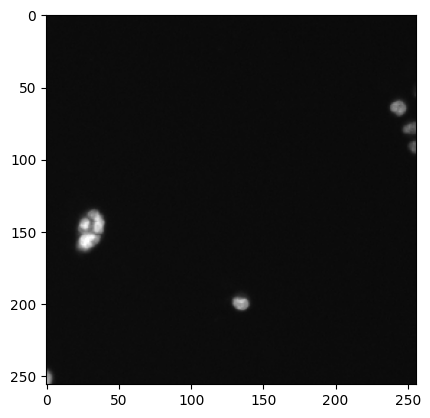

masks


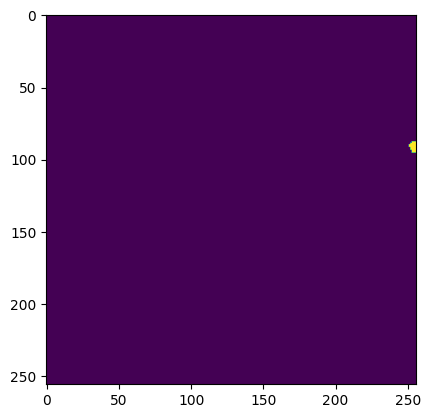

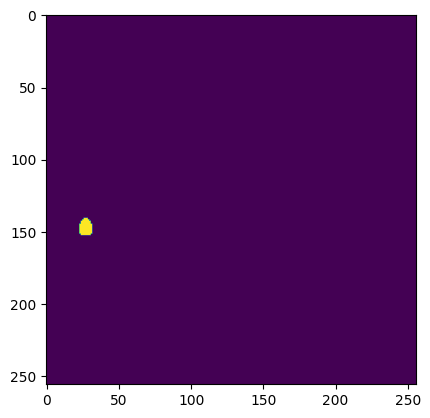

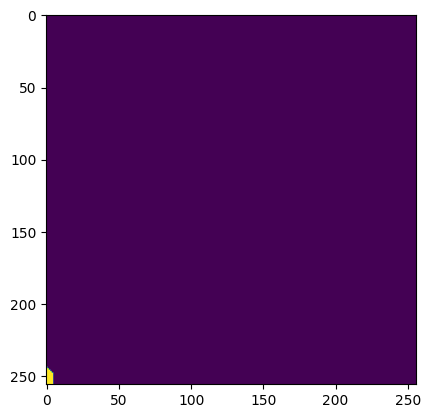

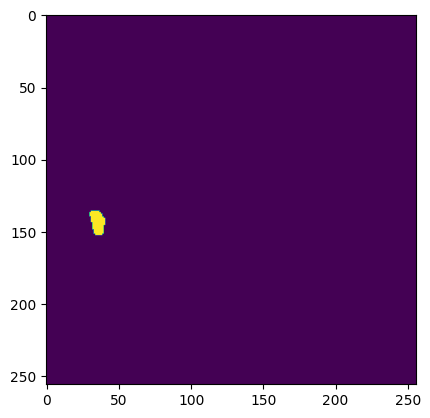

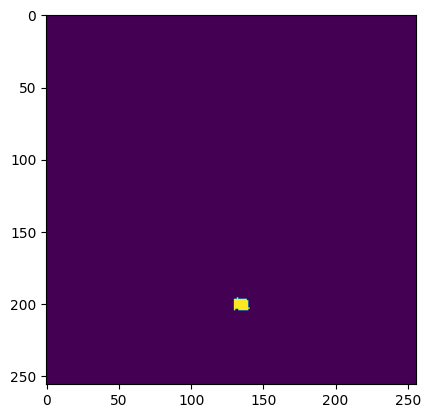

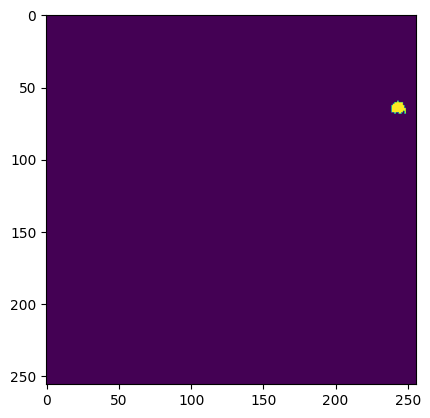

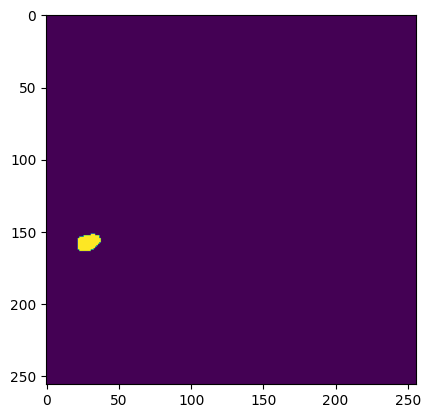

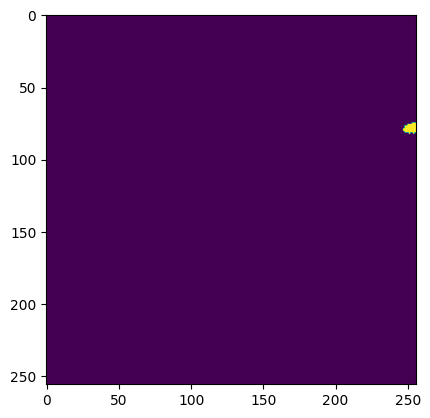

join all masks


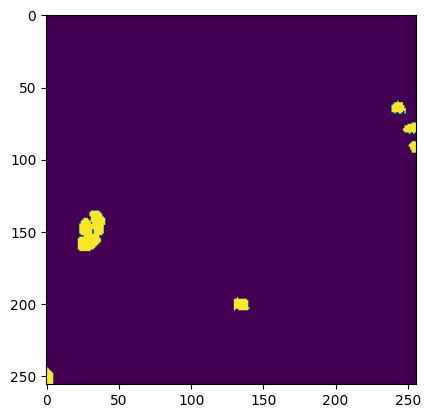

In [ ]:
from PIL import Image
import numpy as np

idx = 1
print(files[idx])
file_name = os.path.join(PATH, files[idx])
file_img = os.path.join(file_name, f'images/{files[idx]}.png')

folder_masks = os.path.join(file_name, 'masks')
file_masks = [os.path.join(folder_masks, mask) for mask in os.listdir(folder_masks)]
# print(file_masks)
image = Image.open(file_img).convert('RGB')
print('image')
image = np.array(image)
imshow(image)
print('masks')

masks = np.zeros(image.shape[:2])
for m in file_masks:
  mask = Image.open(m)
  mask = np.asarray(mask)
  imshow(mask)
  masks += mask
  
print('join all masks')
imshow(masks)

In [ ]:
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn
from torchvision import transforms 

In [ ]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)

class UNET(nn.Module):
    def __init__(
            self, in_channels=3, out_channels=1, features=[64, 128, 256, 512],
    ):
        super(UNET, self).__init__()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        # doblemconv, dobleconv..
        # Down part of UNET
        for feature in features:
            self.downs.append(DoubleConv(in_channels, feature))
            in_channels = feature

        #upsam, doubleconv, up, .. 
        # Up part of UNET
        for feature in reversed(features):
            self.ups.append(#0
                nn.ConvTranspose2d(
                    feature*2, feature, kernel_size=2, stride=2,
                )
            )
            self.ups.append(DoubleConv(feature*2, feature))#1

        self.bottleneck = DoubleConv(features[-1], features[-1]*2)
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        skip_connections = []

        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)

        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1] # reversed(skip_connections)

        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx//2]

            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx+1](concat_skip)

        return self.final_conv(x)

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

data_transforms = A.Compose([
    A.Resize(256,256),
    A.Normalize(),
    ToTensorV2()
])

In [ ]:
class NucleuData(Dataset):
  def __init__(self, files_list):
    super().__init__()
    self.files_list = files_list
  #magic method
  def __len__(self): 
    return len(self.files_list)

  def __getitem__(self, idx):
    file_name = os.path.join(PATH, self.files_list[idx])
    file_img = os.path.join(file_name, f'images/{self.files_list[idx]}.png')

    folder_masks = os.path.join(file_name, 'masks')
    file_masks = [os.path.join(folder_masks, mask) for mask in os.listdir(folder_masks)]

    image = Image.open(file_img).convert('RGB')
    image = np.array(image)

    masks = np.zeros(image.shape[:2], dtype=np.uint8)
    for m in file_masks:
      mask = Image.open(m)
      mask = np.asarray(mask)
      masks += mask

    output = data_transforms(image=image, mask=masks)
    image = output['image']
    masks = output['mask']

    return image, masks.unsqueeze(0)/255
    

In [ ]:
split = 0.8

for i in range(10):
  np.random.shuffle(files)

train_files = files[:int(len(files)*split)]
val_files = files[int(len(files)*split):]

In [ ]:
train_datasets = NucleuData(train_files)
val_datasets = NucleuData(val_files)

In [ ]:
train_dataloader = DataLoader(train_datasets, batch_size=32, shuffle=True, num_workers=2)
val_dataloader = DataLoader(val_datasets, batch_size=32, shuffle=True, num_workers=2)

In [ ]:
model = UNET(in_channels=3, out_channels=1)
model.cuda()

UNET(
  (ups): ModuleList(
    (0): ConvTranspose2d(1024, 512, kernel_size=(2, 2), stride=(2, 2))
    (1): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(1024, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (2): ConvTranspose2d(512, 256, kernel_size=(2, 2), stride=(2, 2))
    (3): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), p

In [ ]:
loss_fn = nn.BCEWithLogitsLoss()
optim = torch.optim.Adam(model.parameters(), lr = 1e-3)

In [ ]:
from tqdm import tqdm
scaler = torch.cuda.amp.GradScaler()

def train_engine(dataloader, model, loss_fn, optim, scaler=scaler):
    model.train()
    loss_one_step = 0
    loop = tqdm(dataloader)
    for data, targets in loop:
        data = data.to('cuda')
        targets = targets.float().to(device="cuda")
        # forward
        with torch.cuda.amp.autocast():
            predictions = model(data)
            loss = loss_fn(predictions, targets)

        optim.zero_grad()
        scaler.scale(loss).backward()
        scaler.step(optim)
        scaler.update()
        loss_one_step += loss.item()

        # update tqdm loop
        loop.set_postfix(loss=loss.item())

    return loss_one_step / len(dataloader)

def val_engine(dataloader, model, loss_fn):
    model.eval()
    loss_one_step = 0
    loop = tqdm(dataloader)

    for data, targets in loop:
        data = data.to('cuda')
        targets = targets.float().to(device="cuda")
        with torch.no_grad():
            with torch.cuda.amp.autocast():
                predictions = model(data)
                loss = loss_fn(predictions, targets)
        loss_one_step += loss.item()

        loop.set_postfix(loss=loss.item())

    return loss_one_step / len(dataloader)

In [ ]:
def train(train_dataloaders, val_dataloaders, model, loss_fn, optim, num_epochs, log_freq=10, save_best_model=False, best_model_name='best_model.pth', last_model_name='last_model.pth'):
    """
    Train the model for a given number of epochs.
    :param train_dataloaders: A dictionary of dataloaders for training and validation.
    :param val_dataloaders: A dictionary of dataloaders for validation.
    :param model: The model to train.
    :param loss_fn: The loss function to use.
    :param optim: The optimizer to use.
    :param num_epochs: The number of epochs to train for.
    :param log_freq: The frequency with which to log training metrics.
    :return: The trained model.
    """
    best_model = None
    best_val_loss = float('inf')

    best_model_name = os.path.join('drive/MyDrive/UNet/ckpt_save', best_model_name)
    last_model_name = os.path.join('drive/MyDrive/UNet/ckpt_save', last_model_name)

    for epoch in range(num_epochs):
        train_loss = train_engine(train_dataloaders, model, loss_fn, optim)
        val_loss = val_engine(val_dataloaders, model, loss_fn)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            if save_best_model:
                best_model = model
                torch.save(best_model.state_dict(), best_model_name)
                torch.save(model.state_dict(), last_model_name)

        if epoch % log_freq == 0:
            print('Epoch {}/{}'.format(epoch, num_epochs - 1))
            print('-' * 10)
            print('Train Loss: {:.4f}'.format(train_loss))
            print('Val Loss: {:.4f}'.format(val_loss))
            print()

    return model

In [ ]:
model = train(train_dataloader, val_dataloader, model, loss_fn, optim, 100, log_freq=1)

100%|██████████| 5/5 [00:04<00:00,  1.07it/s, loss=0.591]


Epoch 0/99
----------
Train Loss: 0.5446
Val Loss: 0.5119



100%|██████████| 5/5 [00:04<00:00,  1.09it/s, loss=3.4]


Epoch 1/99
----------
Train Loss: 0.4113
Val Loss: 3.1956



100%|██████████| 5/5 [00:04<00:00,  1.09it/s, loss=0.556]


Epoch 2/99
----------
Train Loss: 0.3076
Val Loss: 0.5645



100%|██████████| 5/5 [00:05<00:00,  1.09s/it, loss=0.347]


Epoch 3/99
----------
Train Loss: 0.2330
Val Loss: 0.3517



100%|██████████| 5/5 [00:05<00:00,  1.12s/it, loss=0.262]


Epoch 4/99
----------
Train Loss: 0.1872
Val Loss: 0.2646



100%|██████████| 5/5 [00:04<00:00,  1.01it/s, loss=0.724]


Epoch 5/99
----------
Train Loss: 0.1624
Val Loss: 0.8983



100%|██████████| 5/5 [00:04<00:00,  1.01it/s, loss=1.04]


Epoch 6/99
----------
Train Loss: 0.1428
Val Loss: 1.0880



100%|██████████| 5/5 [00:05<00:00,  1.04s/it, loss=0.103]


Epoch 7/99
----------
Train Loss: 0.1264
Val Loss: 0.1695



100%|██████████| 5/5 [00:05<00:00,  1.03s/it, loss=0.0593]


Epoch 8/99
----------
Train Loss: 0.1115
Val Loss: 0.0990



100%|██████████| 5/5 [00:04<00:00,  1.05it/s, loss=0.176]


Epoch 9/99
----------
Train Loss: 0.1031
Val Loss: 0.1188



100%|██████████| 5/5 [00:04<00:00,  1.12it/s, loss=0.0879]


Epoch 10/99
----------
Train Loss: 0.1009
Val Loss: 0.1364



100%|██████████| 5/5 [00:04<00:00,  1.14it/s, loss=0.169]


Epoch 11/99
----------
Train Loss: 0.0918
Val Loss: 0.1594



100%|██████████| 5/5 [00:04<00:00,  1.06it/s, loss=0.287]


Epoch 12/99
----------
Train Loss: 0.0880
Val Loss: 0.2237



100%|██████████| 5/5 [00:04<00:00,  1.02it/s, loss=1.54]


Epoch 13/99
----------
Train Loss: 0.0891
Val Loss: 1.0397



100%|██████████| 5/5 [00:04<00:00,  1.02it/s, loss=0.775]


Epoch 14/99
----------
Train Loss: 0.0834
Val Loss: 0.6332



100%|██████████| 5/5 [00:05<00:00,  1.01s/it, loss=0.0908]


Epoch 15/99
----------
Train Loss: 0.0840
Val Loss: 0.1086



100%|██████████| 5/5 [00:04<00:00,  1.01it/s, loss=0.0706]


Epoch 16/99
----------
Train Loss: 0.0821
Val Loss: 0.0845



100%|██████████| 5/5 [00:04<00:00,  1.08it/s, loss=0.0806]


Epoch 17/99
----------
Train Loss: 0.0814
Val Loss: 0.0843



100%|██████████| 5/5 [00:04<00:00,  1.14it/s, loss=0.0961]


Epoch 18/99
----------
Train Loss: 0.0785
Val Loss: 0.0967



100%|██████████| 5/5 [00:04<00:00,  1.08it/s, loss=0.205]


Epoch 19/99
----------
Train Loss: 0.0783
Val Loss: 0.2305



100%|██████████| 5/5 [00:04<00:00,  1.10it/s, loss=0.109]


Epoch 20/99
----------
Train Loss: 0.0725
Val Loss: 0.0967



100%|██████████| 5/5 [00:04<00:00,  1.09it/s, loss=0.102]


Epoch 21/99
----------
Train Loss: 0.0696
Val Loss: 0.0773



100%|██████████| 5/5 [00:04<00:00,  1.08it/s, loss=0.0618]


Epoch 22/99
----------
Train Loss: 0.0703
Val Loss: 0.0788



100%|██████████| 5/5 [00:04<00:00,  1.03it/s, loss=0.069]


Epoch 23/99
----------
Train Loss: 0.0699
Val Loss: 0.0854



100%|██████████| 5/5 [00:04<00:00,  1.04it/s, loss=0.127]


Epoch 24/99
----------
Train Loss: 0.0674
Val Loss: 0.0927



100%|██████████| 5/5 [00:04<00:00,  1.06it/s, loss=0.234]


Epoch 25/99
----------
Train Loss: 0.0703
Val Loss: 0.2338



100%|██████████| 5/5 [00:04<00:00,  1.03it/s, loss=0.0343]


Epoch 26/99
----------
Train Loss: 0.0690
Val Loss: 0.0678



100%|██████████| 5/5 [00:04<00:00,  1.09it/s, loss=0.0816]


Epoch 27/99
----------
Train Loss: 0.0714
Val Loss: 0.0840



100%|██████████| 5/5 [00:04<00:00,  1.09it/s, loss=0.0262]


Epoch 28/99
----------
Train Loss: 0.0686
Val Loss: 0.0630



100%|██████████| 5/5 [00:04<00:00,  1.10it/s, loss=0.0394]


Epoch 29/99
----------
Train Loss: 0.0661
Val Loss: 0.0646



100%|██████████| 5/5 [00:04<00:00,  1.07it/s, loss=0.26]


Epoch 30/99
----------
Train Loss: 0.0666
Val Loss: 0.1132



100%|██████████| 5/5 [00:05<00:00,  1.09s/it, loss=0.16]


Epoch 31/99
----------
Train Loss: 0.0675
Val Loss: 0.1702



100%|██████████| 5/5 [00:05<00:00,  1.17s/it, loss=0.087]


Epoch 32/99
----------
Train Loss: 0.0721
Val Loss: 0.0812



100%|██████████| 5/5 [00:05<00:00,  1.13s/it, loss=0.415]


Epoch 33/99
----------
Train Loss: 0.0693
Val Loss: 0.3426



100%|██████████| 5/5 [00:05<00:00,  1.17s/it, loss=0.0749]


Epoch 34/99
----------
Train Loss: 0.0660
Val Loss: 0.0737



100%|██████████| 5/5 [00:05<00:00,  1.19s/it, loss=0.223]


Epoch 35/99
----------
Train Loss: 0.0638
Val Loss: 0.1652



100%|██████████| 5/5 [00:05<00:00,  1.15s/it, loss=0.384]


Epoch 36/99
----------
Train Loss: 0.0815
Val Loss: 0.3864



100%|██████████| 5/5 [00:05<00:00,  1.16s/it, loss=0.0901]


Epoch 37/99
----------
Train Loss: 0.0729
Val Loss: 0.0936



100%|██████████| 5/5 [00:05<00:00,  1.19s/it, loss=0.0747]


Epoch 38/99
----------
Train Loss: 0.0704
Val Loss: 0.0804



100%|██████████| 5/5 [00:05<00:00,  1.11s/it, loss=0.0357]


Epoch 39/99
----------
Train Loss: 0.0826
Val Loss: 0.0781



100%|██████████| 5/5 [00:06<00:00,  1.21s/it, loss=0.063]


Epoch 40/99
----------
Train Loss: 0.0758
Val Loss: 0.0901



100%|██████████| 5/5 [00:05<00:00,  1.17s/it, loss=1.06]


Epoch 41/99
----------
Train Loss: 0.0762
Val Loss: 0.9537



100%|██████████| 5/5 [00:06<00:00,  1.26s/it, loss=0.155]


Epoch 42/99
----------
Train Loss: 0.0686
Val Loss: 0.0884



100%|██████████| 5/5 [00:05<00:00,  1.18s/it, loss=0.159]


Epoch 43/99
----------
Train Loss: 0.0661
Val Loss: 0.0855



100%|██████████| 5/5 [00:05<00:00,  1.18s/it, loss=0.38]


Epoch 44/99
----------
Train Loss: 0.0669
Val Loss: 0.3712



100%|██████████| 5/5 [00:05<00:00,  1.17s/it, loss=0.029]


Epoch 45/99
----------
Train Loss: 0.0642
Val Loss: 0.0622



100%|██████████| 5/5 [00:05<00:00,  1.18s/it, loss=0.0286]


Epoch 46/99
----------
Train Loss: 0.0626
Val Loss: 0.0652



100%|██████████| 5/5 [00:06<00:00,  1.22s/it, loss=0.0361]


Epoch 47/99
----------
Train Loss: 0.0635
Val Loss: 0.0626



100%|██████████| 5/5 [00:05<00:00,  1.13s/it, loss=0.0885]


Epoch 48/99
----------
Train Loss: 0.0668
Val Loss: 0.0825



100%|██████████| 5/5 [00:05<00:00,  1.08s/it, loss=0.0575]


Epoch 49/99
----------
Train Loss: 0.0627
Val Loss: 0.0664



100%|██████████| 5/5 [00:05<00:00,  1.07s/it, loss=0.0524]


Epoch 50/99
----------
Train Loss: 0.0623
Val Loss: 0.0928



100%|██████████| 5/5 [00:05<00:00,  1.05s/it, loss=0.0799]


Epoch 51/99
----------
Train Loss: 0.0625
Val Loss: 0.0789



100%|██████████| 5/5 [00:06<00:00,  1.22s/it, loss=0.0396]


Epoch 52/99
----------
Train Loss: 0.0613
Val Loss: 0.0618



100%|██████████| 5/5 [00:05<00:00,  1.12s/it, loss=0.0304]


Epoch 53/99
----------
Train Loss: 0.0616
Val Loss: 0.0621



100%|██████████| 5/5 [00:05<00:00,  1.16s/it, loss=0.0514]


Epoch 54/99
----------
Train Loss: 0.0602
Val Loss: 0.0649



100%|██████████| 5/5 [00:05<00:00,  1.18s/it, loss=0.0517]


Epoch 55/99
----------
Train Loss: 0.0594
Val Loss: 0.0615



100%|██████████| 5/5 [00:05<00:00,  1.17s/it, loss=0.0544]


Epoch 56/99
----------
Train Loss: 0.0589
Val Loss: 0.0626



100%|██████████| 5/5 [00:05<00:00,  1.09s/it, loss=0.137]


Epoch 57/99
----------
Train Loss: 0.0591
Val Loss: 0.0788



100%|██████████| 5/5 [00:05<00:00,  1.17s/it, loss=0.0585]


Epoch 58/99
----------
Train Loss: 0.0607
Val Loss: 0.0654



100%|██████████| 5/5 [00:06<00:00,  1.35s/it, loss=0.194]


Epoch 59/99
----------
Train Loss: 0.0607
Val Loss: 0.0847



100%|██████████| 5/5 [00:05<00:00,  1.15s/it, loss=0.102]


Epoch 60/99
----------
Train Loss: 0.0605
Val Loss: 0.1088



100%|██████████| 5/5 [00:05<00:00,  1.18s/it, loss=0.0289]


Epoch 61/99
----------
Train Loss: 0.0600
Val Loss: 0.0592



100%|██████████| 5/5 [00:06<00:00,  1.21s/it, loss=0.0979]


Epoch 62/99
----------
Train Loss: 0.0599
Val Loss: 0.0703



100%|██████████| 5/5 [00:05<00:00,  1.15s/it, loss=0.0445]


Epoch 63/99
----------
Train Loss: 0.0583
Val Loss: 0.0618



100%|██████████| 5/5 [00:05<00:00,  1.11s/it, loss=0.0709]


Epoch 64/99
----------
Train Loss: 0.0575
Val Loss: 0.0666



100%|██████████| 5/5 [00:05<00:00,  1.07s/it, loss=0.0411]


Epoch 65/99
----------
Train Loss: 0.0575
Val Loss: 0.0608



100%|██████████| 5/5 [00:05<00:00,  1.18s/it, loss=0.0586]


Epoch 66/99
----------
Train Loss: 0.0574
Val Loss: 0.0649



100%|██████████| 5/5 [00:05<00:00,  1.18s/it, loss=0.0392]


Epoch 67/99
----------
Train Loss: 0.0567
Val Loss: 0.0608



100%|██████████| 5/5 [00:06<00:00,  1.25s/it, loss=0.0833]


Epoch 68/99
----------
Train Loss: 0.0578
Val Loss: 0.0688



100%|██████████| 5/5 [00:05<00:00,  1.14s/it, loss=0.0461]


Epoch 69/99
----------
Train Loss: 0.0588
Val Loss: 0.0693



100%|██████████| 5/5 [00:05<00:00,  1.15s/it, loss=0.0293]


Epoch 70/99
----------
Train Loss: 0.0584
Val Loss: 0.0605



100%|██████████| 5/5 [00:05<00:00,  1.17s/it, loss=0.0817]


Epoch 71/99
----------
Train Loss: 0.0587
Val Loss: 0.0908



100%|██████████| 5/5 [00:05<00:00,  1.11s/it, loss=0.0581]


Epoch 72/99
----------
Train Loss: 0.0610
Val Loss: 0.0758



100%|██████████| 5/5 [00:05<00:00,  1.19s/it, loss=0.149]


Epoch 73/99
----------
Train Loss: 0.0597
Val Loss: 0.0838



100%|██████████| 5/5 [00:06<00:00,  1.20s/it, loss=0.128]


Epoch 74/99
----------
Train Loss: 0.0578
Val Loss: 0.0843



100%|██████████| 5/5 [00:06<00:00,  1.20s/it, loss=0.184]


Epoch 75/99
----------
Train Loss: 0.0580
Val Loss: 0.0875



100%|██████████| 5/5 [00:05<00:00,  1.06s/it, loss=0.0369]


Epoch 76/99
----------
Train Loss: 0.0583
Val Loss: 0.0625



100%|██████████| 5/5 [00:05<00:00,  1.11s/it, loss=0.0674]


Epoch 77/99
----------
Train Loss: 0.0580
Val Loss: 0.0817



100%|██████████| 5/5 [00:05<00:00,  1.09s/it, loss=0.091]


Epoch 78/99
----------
Train Loss: 0.0585
Val Loss: 0.0718



100%|██████████| 5/5 [00:05<00:00,  1.13s/it, loss=0.0398]


Epoch 79/99
----------
Train Loss: 0.0562
Val Loss: 0.0639



100%|██████████| 5/5 [00:06<00:00,  1.32s/it, loss=0.1]


Epoch 80/99
----------
Train Loss: 0.0566
Val Loss: 0.0876



100%|██████████| 5/5 [00:05<00:00,  1.09s/it, loss=0.0644]


Epoch 81/99
----------
Train Loss: 0.0575
Val Loss: 0.0715



100%|██████████| 5/5 [00:05<00:00,  1.14s/it, loss=0.0997]


Epoch 82/99
----------
Train Loss: 0.0579
Val Loss: 0.0715



100%|██████████| 5/5 [00:06<00:00,  1.21s/it, loss=0.0797]


Epoch 83/99
----------
Train Loss: 0.0571
Val Loss: 0.0883



100%|██████████| 5/5 [00:05<00:00,  1.11s/it, loss=0.0478]


Epoch 84/99
----------
Train Loss: 0.0567
Val Loss: 0.0644



100%|██████████| 5/5 [00:05<00:00,  1.08s/it, loss=0.0609]


Epoch 85/99
----------
Train Loss: 0.0559
Val Loss: 0.0675



100%|██████████| 5/5 [00:05<00:00,  1.14s/it, loss=0.0308]


Epoch 86/99
----------
Train Loss: 0.0552
Val Loss: 0.0566



100%|██████████| 5/5 [00:05<00:00,  1.12s/it, loss=1.55]


Epoch 87/99
----------
Train Loss: 0.0576
Val Loss: 1.3287



100%|██████████| 5/5 [00:05<00:00,  1.15s/it, loss=0.182]


Epoch 88/99
----------
Train Loss: 0.0592
Val Loss: 0.2188



100%|██████████| 5/5 [00:06<00:00,  1.28s/it, loss=0.46]


Epoch 89/99
----------
Train Loss: 0.0570
Val Loss: 0.4065



100%|██████████| 5/5 [00:05<00:00,  1.19s/it, loss=0.0468]


Epoch 90/99
----------
Train Loss: 0.0572
Val Loss: 0.0718



100%|██████████| 5/5 [00:05<00:00,  1.20s/it, loss=0.153]


Epoch 91/99
----------
Train Loss: 0.0567
Val Loss: 0.0821



100%|██████████| 5/5 [00:05<00:00,  1.10s/it, loss=0.15]


Epoch 92/99
----------
Train Loss: 0.0559
Val Loss: 0.0772



100%|██████████| 5/5 [00:05<00:00,  1.15s/it, loss=0.0641]


Epoch 93/99
----------
Train Loss: 0.0577
Val Loss: 0.0688



100%|██████████| 5/5 [00:05<00:00,  1.17s/it, loss=0.0766]


Epoch 94/99
----------
Train Loss: 0.0570
Val Loss: 0.0667



100%|██████████| 5/5 [00:06<00:00,  1.28s/it, loss=0.0747]


Epoch 95/99
----------
Train Loss: 0.0559
Val Loss: 0.0716



100%|██████████| 5/5 [00:05<00:00,  1.14s/it, loss=0.0673]


Epoch 96/99
----------
Train Loss: 0.0550
Val Loss: 0.0625



100%|██████████| 5/5 [00:05<00:00,  1.16s/it, loss=0.0586]


Epoch 97/99
----------
Train Loss: 0.0551
Val Loss: 0.0621



100%|██████████| 5/5 [00:05<00:00,  1.15s/it, loss=0.0428]


Epoch 98/99
----------
Train Loss: 0.0544
Val Loss: 0.0662



100%|██████████| 5/5 [00:05<00:00,  1.11s/it, loss=0.0259]

Epoch 99/99
----------
Train Loss: 0.0549
Val Loss: 0.0584



In [ ]:
def inference(tensor):
  with torch.no_grad():
    tensor = torch.unsqueeze(tensor, dim=0).to('cuda')
    result = model(tensor)
    result = torch.sigmoid(result)

  return result

def imshow_from_tensor(tensor):
  tensor = torch.squeeze(tensor)
  tensor = tensor.cpu().detach().numpy()
  imshow(tensor)

Predict: 


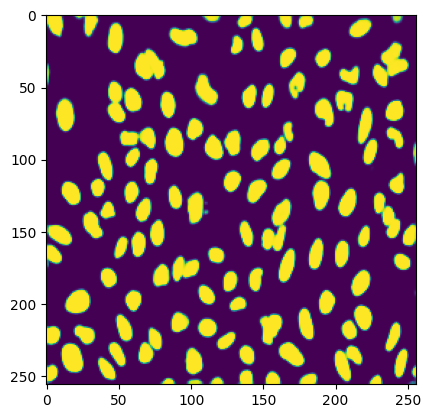

Groundtruth: 


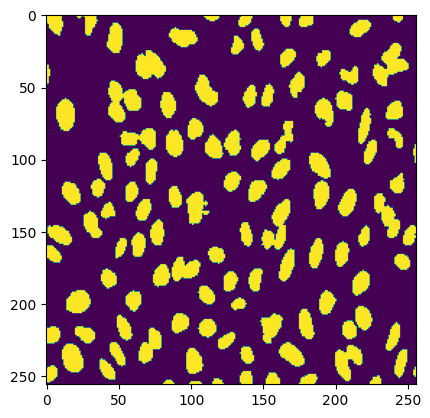

Predict: 


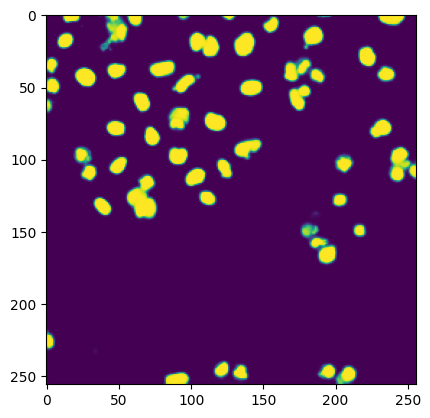

Groundtruth: 


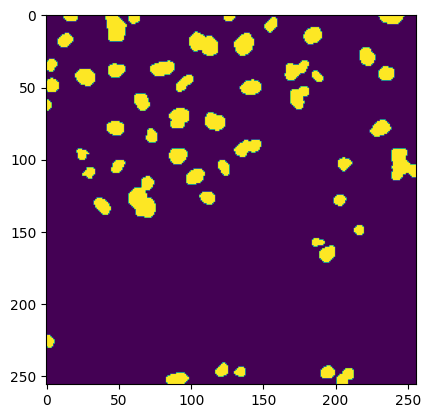

Predict: 


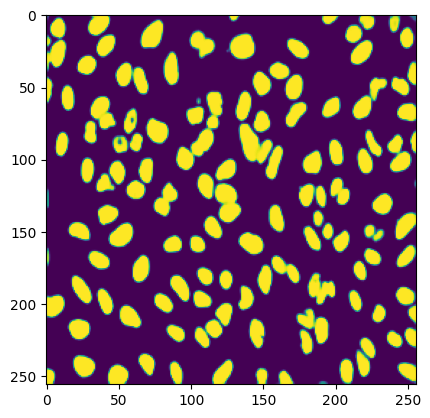

Groundtruth: 


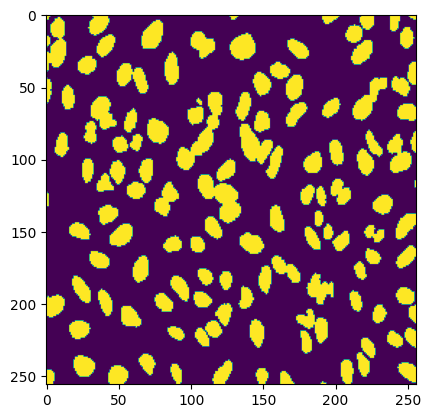

Predict: 


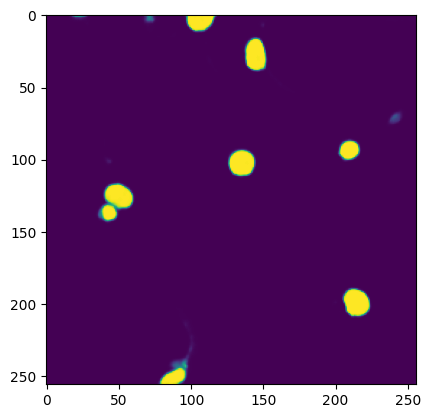

Groundtruth: 


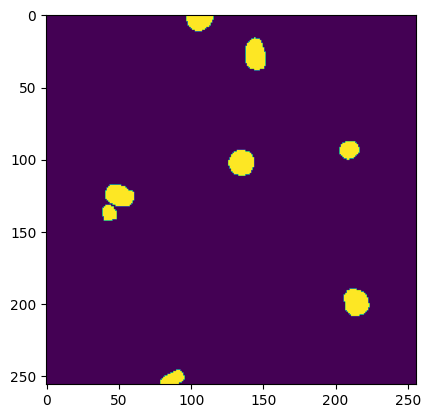

Predict: 


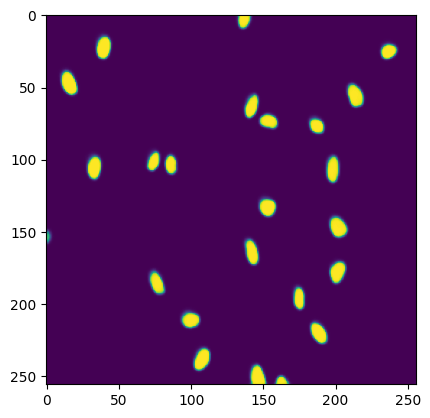

Groundtruth: 


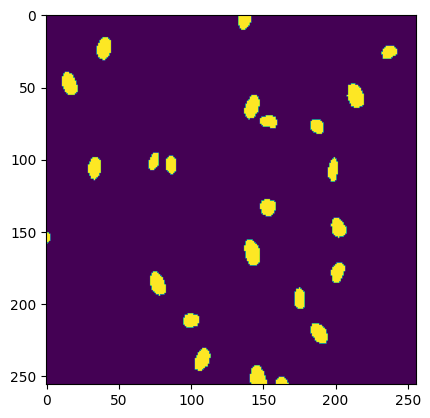

Predict: 


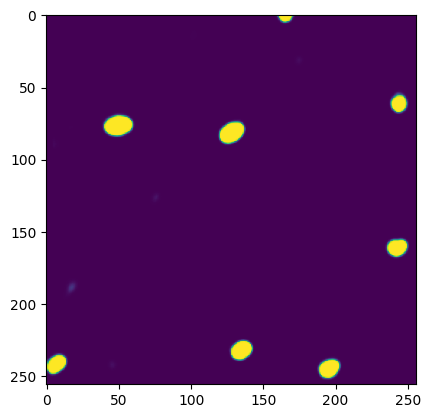

Groundtruth: 


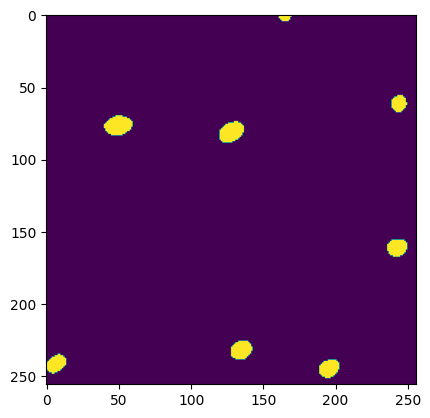

Predict: 


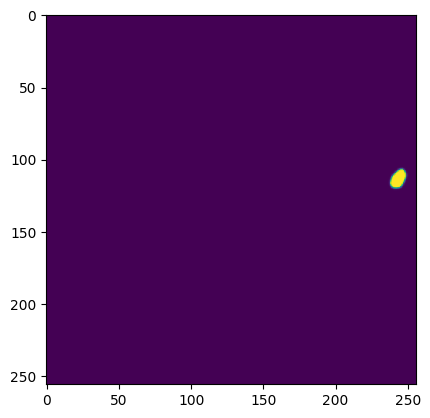

Groundtruth: 


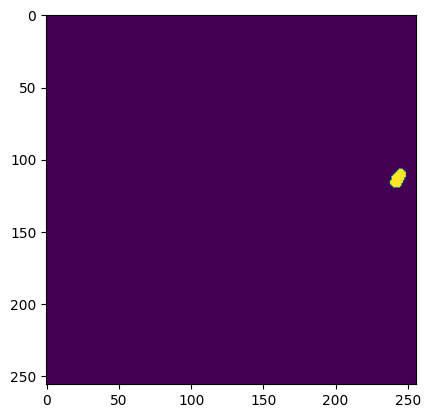

Predict: 


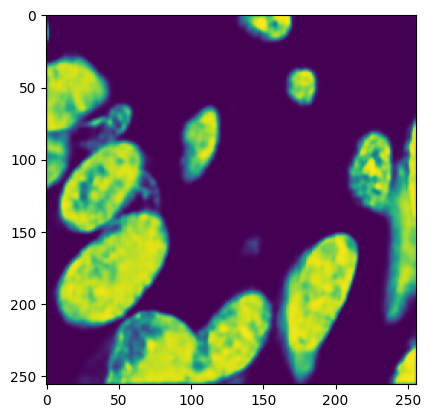

Groundtruth: 


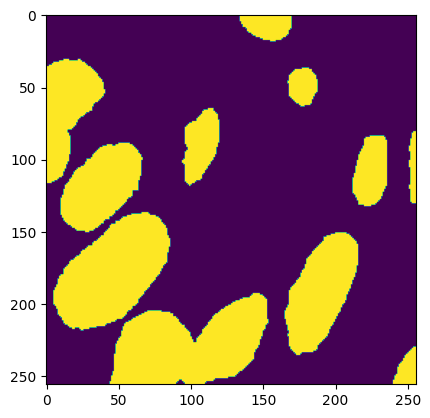

Predict: 


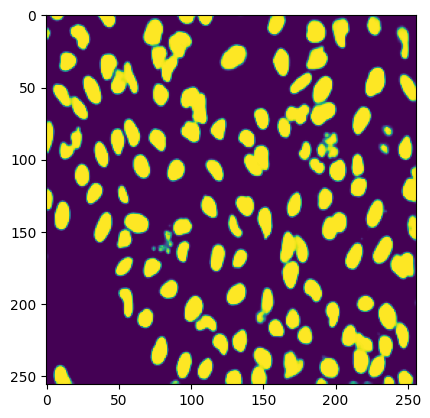

Groundtruth: 


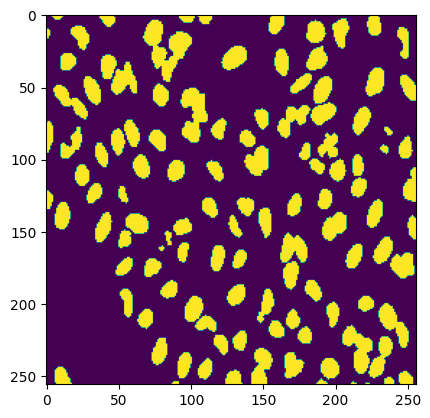

Predict: 


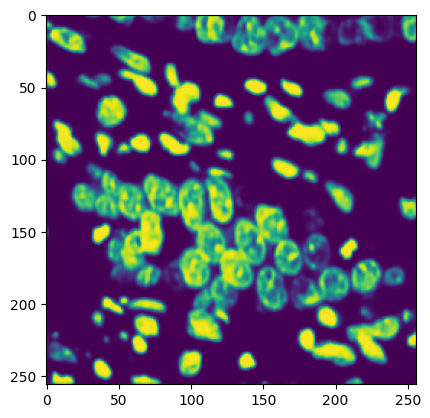

Groundtruth: 


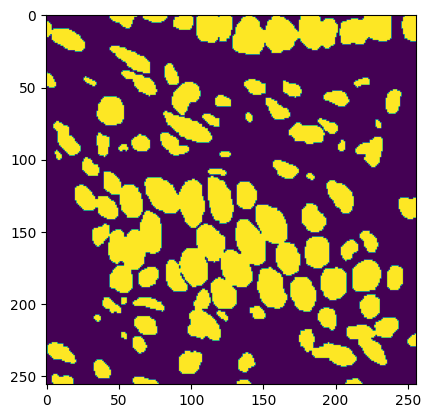

In [ ]:
get = 10

for i in range(get):
  data, targets = val_datasets[i]
  result = inference(data)
  print('Predict: ')
  imshow_from_tensor(result)
  print('Groundtruth: ')
  imshow_from_tensor(targets)

In [ ]:
class NucleuDataTest(Dataset):
  def __init__(self, files_list):
    super().__init__()
    self.files_list = files_list
    self.train = train
  #magic method
  def __len__(self):
    return len(self.files_list)

  def __getitem__(self, idx):
    file_name = os.path.join(PATH_TEST, self.files_list[idx])
    file_img = os.path.join(file_name, f'images/{self.files_list[idx]}.png')

    image = Image.open(file_img).convert('RGB')
    image = np.array(image)
    image_ori = image.copy()

    output = data_transforms(image=image)
    image = output['image']

    return image, image_ori

In [ ]:
PATH_TEST = 'datasets_used/test/'
test_file_list = os.listdir(PATH_TEST)
print(test_file_list)

['31f1fbe85b8899258ea5bcf5f93f7ac8238660c386aeab40649c715bd2e38a0a', '336d3e4105766f8ad328a7ee9571e743f376f8cbcf6a969ca7e353fe3235c523', 'b83d1d77935b6cfd44105b54600ffc4b6bd82de57dec65571bcb117fa8398ba3', '8b59819fbc92eefe45b1db95c0cc3a467ddcfc755684c7f2ba2f6ccb9ad740ab', 'a4816cc1fb76cb3c5e481186833fc0ae9cf426a1406a2607e974e65e9cddba4f', '43a71aeb641faa18742cb826772a8566c6c947d7050f9ab15459de6cc2b3b6af', '699f2992cd71e2e28cf45f81347ff22e76b37541ce88087742884cd0e9aadc68', '0114f484a16c152baa2d82fdd43740880a762c93f436c8988ac461c5c9dbe7d5', 'c8e79ff4ac55f4b772057de28e539727b7f4f2a3de73bf7a082a0ace86d609eb', 'df40099c6306ca1f47fcc8a62e2fa39486d4e223177afdc51b2ad189691802d8', '9f17aea854db13015d19b34cb2022cfdeda44133323fcd6bb3545f7b9404d8ab', '912a679e4b9b1d1a75170254fd675b8c24b664d80ad7ea7e460241a23535a406', 'fac507fa4d1649e8b24c195d990f1fc3ca3633d917839e1751a9d412a14ab5e3', '4727d94c6a57ed484270fdd8bbc6e3d5f2f15d5476794a4e37a40f2309a091e2', '4f949bd8d914bbfa06f40d6a0e2b5b75c38bf53dbcbafc

Prediction


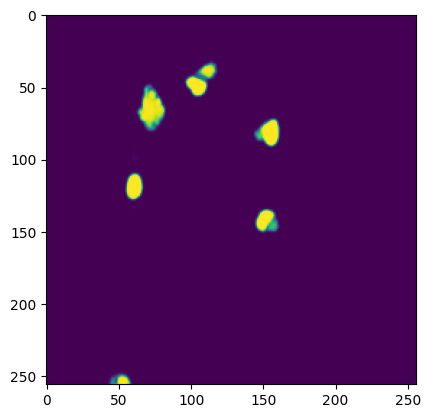

original_image


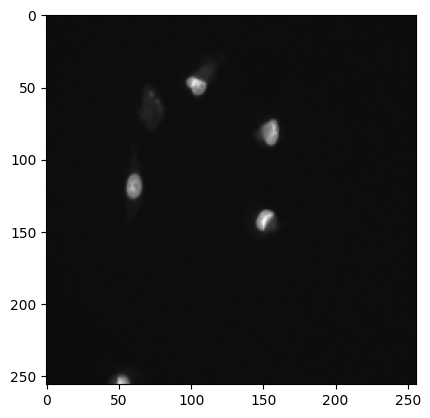

Prediction


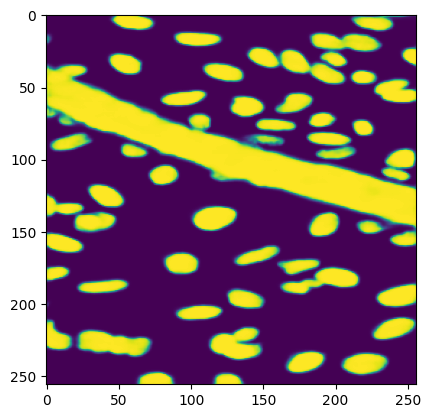

original_image


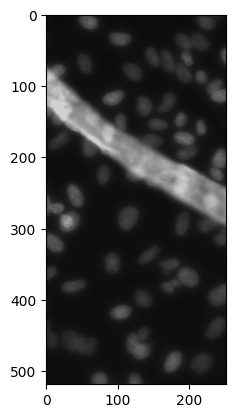

Prediction


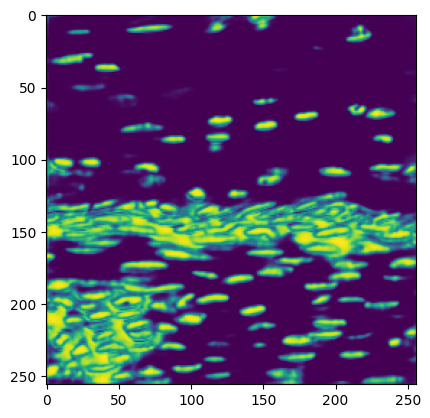

original_image


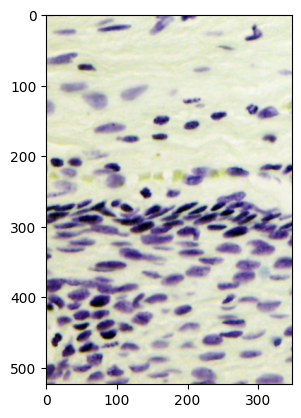

Prediction


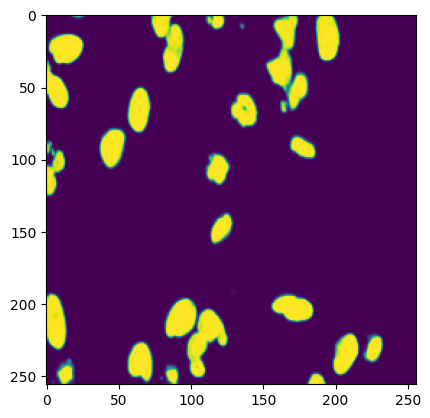

original_image


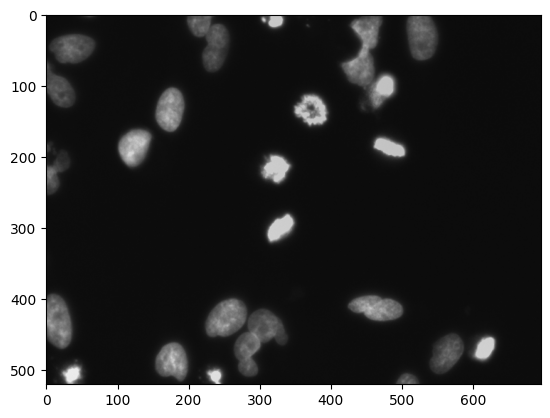

Prediction


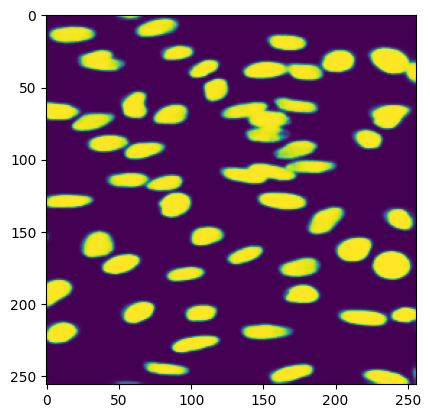

original_image


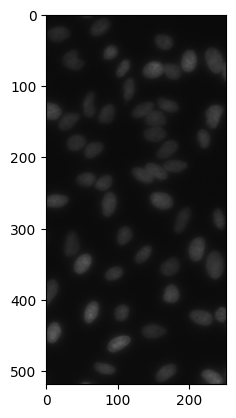

Prediction


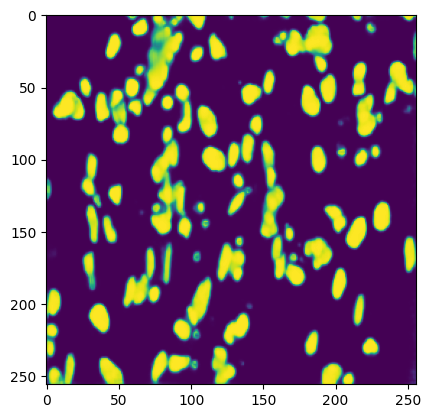

original_image


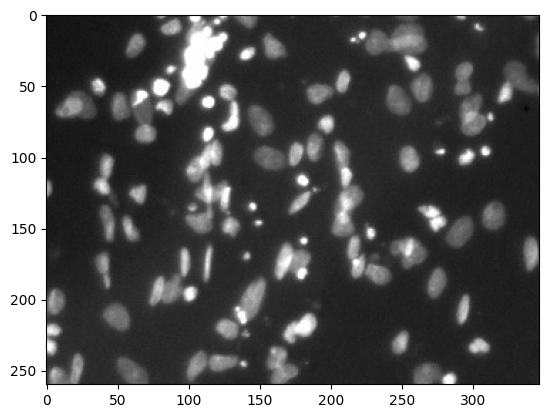

Prediction


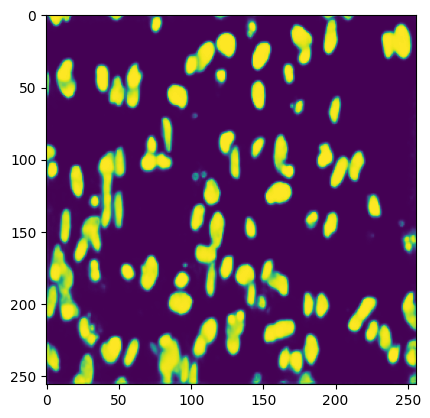

original_image


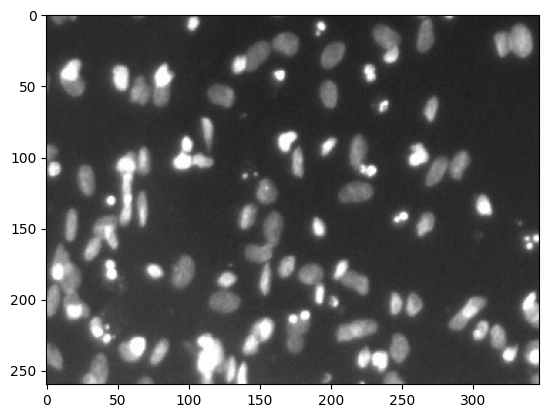

Prediction


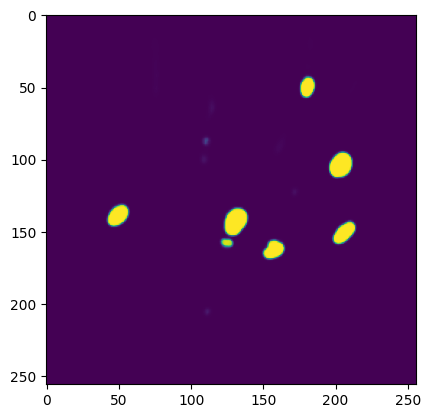

original_image


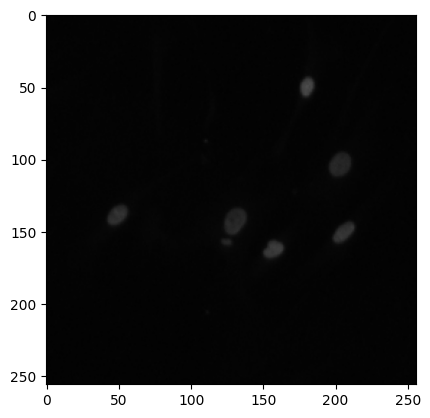

Prediction


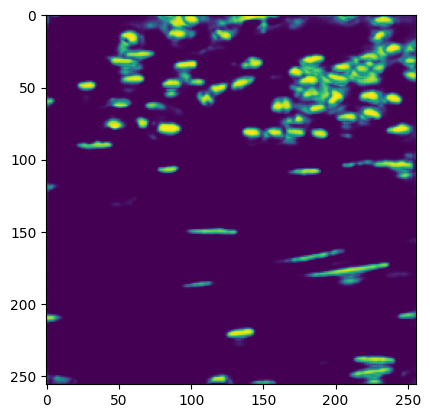

original_image


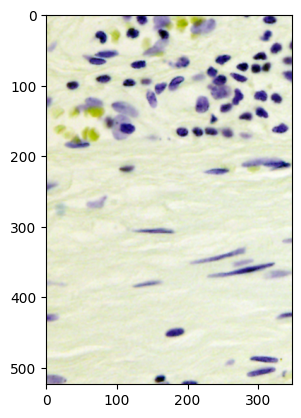

Prediction


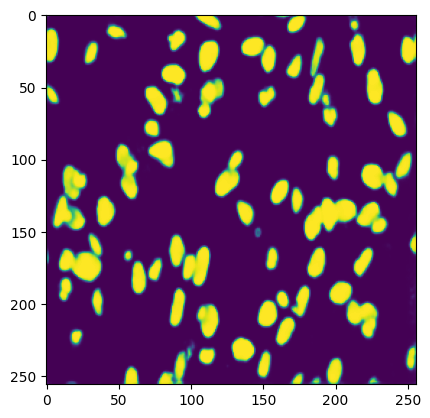

original_image


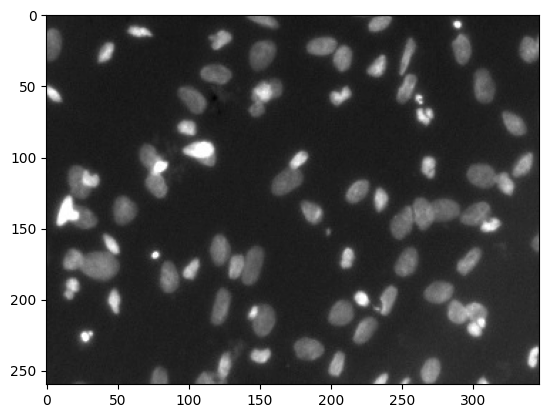

In [ ]:
test_datasets = NucleuDataTest(test_file_list)

get = 10

for i in range(get):
  data, image_ori = test_datasets[i]
  result = inference(data)
  print('Prediction')
  imshow_from_tensor(result)
  print('original_image')
  imshow(image_ori)